<a href="https://colab.research.google.com/github/natihbernan/productdetectionchallenge/blob/master/Product_Detection_Shopee_Code_League.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Product Detection using Convolutional Neural Network

This notebook contains the code of our team project on Shopee Code League Product Detection Challenge

---

Team: "Ganteng" Organization

### Import the Data

We import the dataset used in this project from Kaggle into Colab environment. After that we extract the data since it is in .zip format.

In [1]:
# Colab library to upload files to notebook
from google.colab import files

# Install Kaggle library
#!pip install -q kaggle
!pip uninstall -y kaggle
!pip install --upgrade pip
!pip install kaggle==1.5.6

Uninstalling kaggle-1.5.6:
  Successfully uninstalled kaggle-1.5.6
     |████████████████████████████████| 1.5MB 2.8MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
     |████████████████████████████████| 58 kB 1.6 MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.6-py3-none-any.whl size=72859 sha256=7306e0855578728c88fd7647addb0782d5550a5db92a6275b30f6efa945fbb5d
  Stored in directory: /root/.cache/pip/wheels/01/3e/ff/77407ebac3ef71a79b9166a8382aecf88415a0bcbe3c095a01
Successfully built kaggle


In [2]:
# Upload kaggle API key file
data = files.upload()

Saving kaggle.json to kaggle.json


In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Download the dataset from kaggle
!kaggle competitions download -c shopee-product-detection-open

100% 9.38G/9.38G [02:27<00:00, 53.0MB/s]
100% 9.38G/9.38G [02:27<00:00, 68.1MB/s]


In [ ]:
# Extract zipfile
import zipfile
zip_ref = zipfile.ZipFile('/content/shopee-product-detection-open.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

### Creating New Directories

First, to avoid confusion, we **rename the directory `'/content/train/'` to `'/content/train-and-val/'`**. We do this manually using the panel on the left side.

Next, inside `'/content/train-and-val/'`, there is already a directory called `'.../train/train/'` which consist of all the train image we have. We will split the images and input the rest of the image in a new directory `'.../val/'`. Before that we need to make the `'.../val/'` directory first.

In [ ]:
import os
os.mkdir('/content/train-and-val/val/')
for i in os.listdir('/content/train-and-val/train/train/'):
  os.mkdir('/content/train-and-val/val/' + i)

### Train and Validation Split

Now that we have the validation folder, we can split the images to train and validation. We use 0.8 as our split threshold. That is, we use 0.8 of the data for training and the rest 0.2 for validation. First we create a function to do our split.

In [ ]:
import random
from shutil import copyfile

def train_val_split(source, val_dir, train_ratio):
  total_size = len(os.listdir(source))
  train_size = int(train_ratio * total_size)
  val_size = total_size - train_size

  randomized = random.sample(os.listdir(source), total_size)
  val_files = randomized[train_size:total_size]

  for filename in val_files:
    i_file = source + filename
    destination = val_dir + filename
    copyfile(i_file, destination)

Now we can use our function to split our dataset.

In [ ]:
train_ratio = 0.8

for i in sorted(os.listdir('/content/train-and-val/train/train/')):
  source = '/content/train-and-val/train/train/' + i + '/'
  val_dir = '/content/train-and-val/val/' + i + '/'
  train_val_split(source, val_dir, train_ratio)

In [ ]:
print('Number of images of :')
for i in ['train', 'val']:
  for j in sorted(os.listdir('/content/train-and-val/train/train/')):
    if i == 'train':
      print('Category', j, 'in train :', len(os.listdir('/content/train-and-val/train/train/' + j)))
    else:
      print('Category', j, 'in', i, ':', len(os.listdir('/content/train-and-val/' + i + '/' + j)))

Number of images of :
Category 00 in train : 2683
Category 01 in train : 2703
Category 02 in train : 2687
Category 03 in train : 2703
Category 04 in train : 2703
Category 05 in train : 2641
Category 06 in train : 2641
Category 07 in train : 2661
Category 08 in train : 2700
Category 09 in train : 2698
Category 10 in train : 2673
Category 11 in train : 1843
Category 12 in train : 2691
Category 13 in train : 2682
Category 14 in train : 2685
Category 15 in train : 2632
Category 16 in train : 2665
Category 17 in train : 1553
Category 18 in train : 2104
Category 19 in train : 2679
Category 20 in train : 2654
Category 21 in train : 2598
Category 22 in train : 2623
Category 23 in train : 2540
Category 24 in train : 2705
Category 25 in train : 2692
Category 26 in train : 2684
Category 27 in train : 2702
Category 28 in train : 2561
Category 29 in train : 2138
Category 30 in train : 2705
Category 31 in train : 2677
Category 32 in train : 2157
Category 33 in train : 573
Category 34 in train : 2599

In [ ]:
num_of_train = 0
num_of_val = 0

for i in sorted(os.listdir('/content/train-and-val/val/')):
  num_of_train += len(os.listdir('/content/train-and-val/train/train/' + i))
  num_of_val += len(os.listdir('/content/train-and-val/val/' + i))
total_images = num_of_train + num_of_val

print('Total images in train :', num_of_train)
print('Total images in val   :', num_of_val)
print('Total images          :', total_images)

Total images in train : 105396
Total images in val   : 21096
Total images          : 126492


To get a better sense of our dataset, we will show some sample images of our data for each class

**Note : Somehow I can't use looping here to show all the pictures, so I do it manually instead. Will try to work on this later**

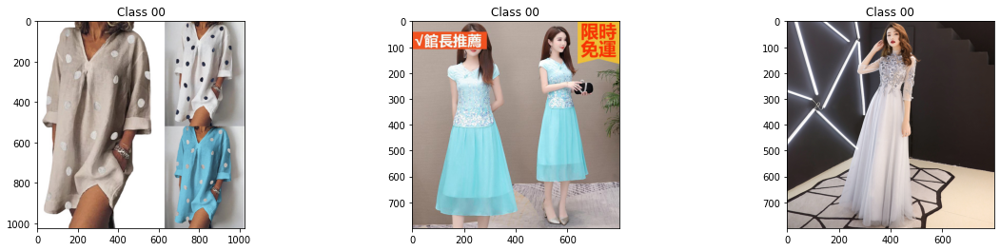

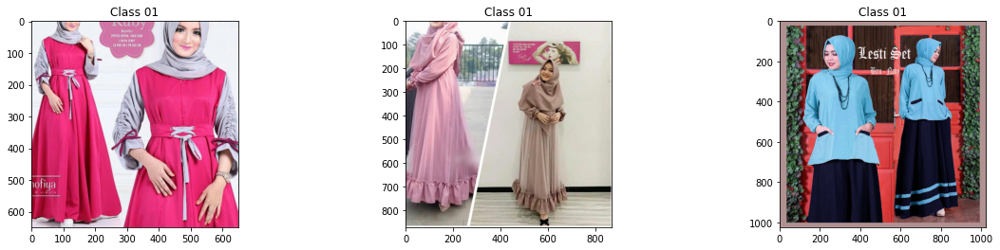

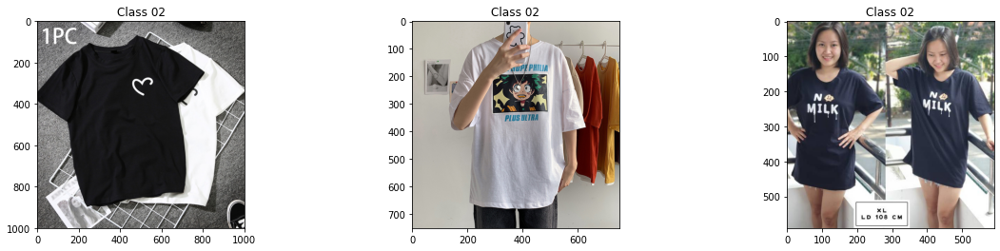

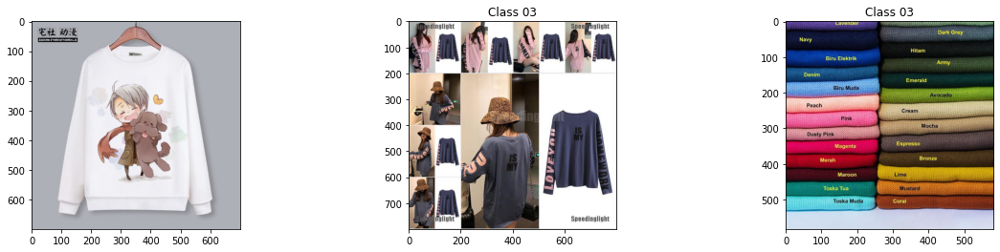

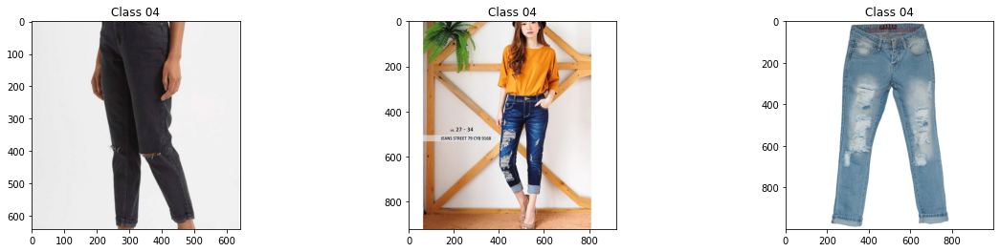

...

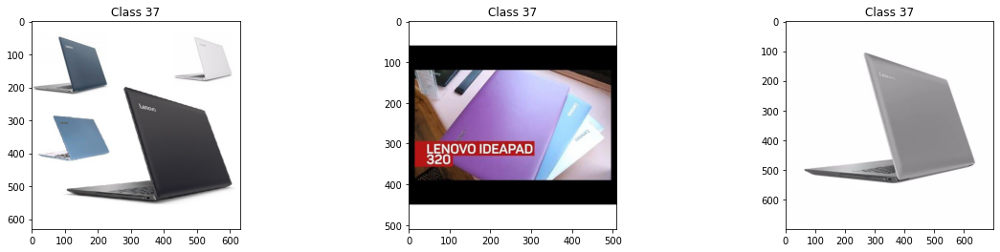

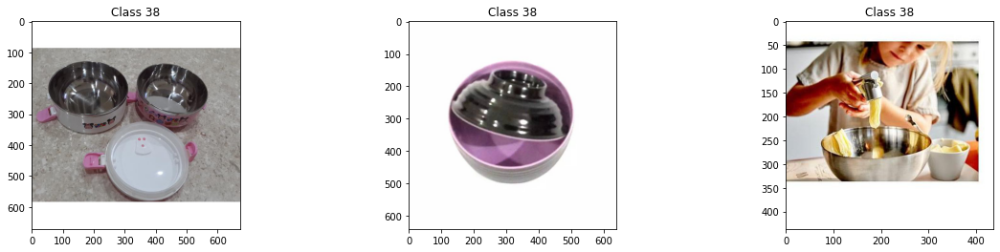

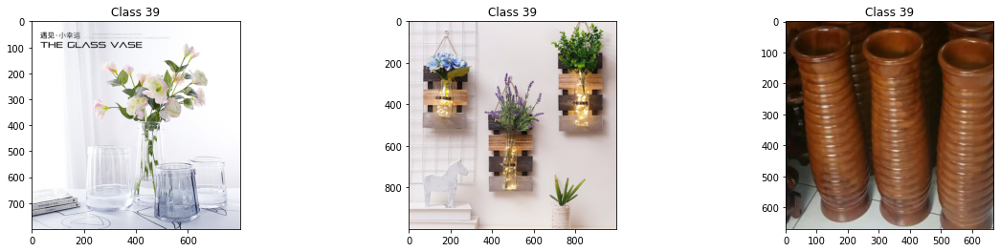

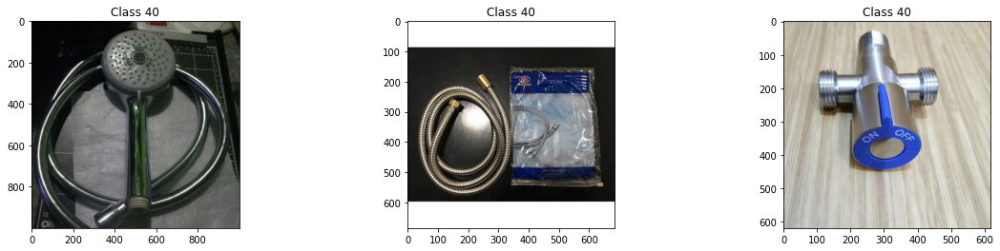

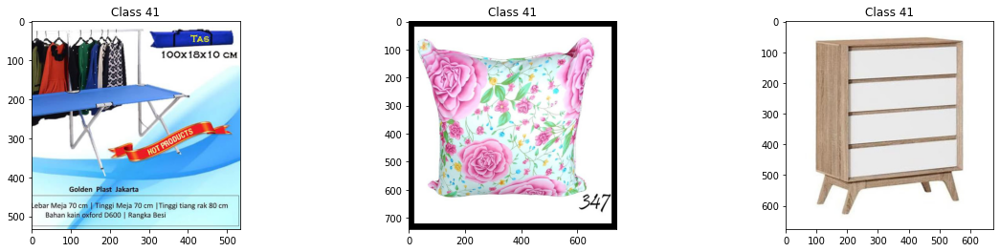

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.rcParams.update({'figure.max_open_warning': 0})

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 00')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/00/' + os.listdir('/content/train-and-val/train/train/00')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 00')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/00/' + os.listdir('/content/train-and-val/train/train/00')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 00')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/00/' + os.listdir('/content/train-and-val/train/train/00')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 01')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/01/' + os.listdir('/content/train-and-val/train/train/01')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 01')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/01/' + os.listdir('/content/train-and-val/train/train/01')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 01')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/01/' + os.listdir('/content/train-and-val/train/train/01')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 02')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/02/' + os.listdir('/content/train-and-val/train/train/02')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 02')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/02/' + os.listdir('/content/train-and-val/train/train/02')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 02')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/02/' + os.listdir('/content/train-and-val/train/train/02')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/03/' + os.listdir('/content/train-and-val/train/train/03')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 03')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/03/' + os.listdir('/content/train-and-val/train/train/03')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 03')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/03/' + os.listdir('/content/train-and-val/train/train/03')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 04')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/04/' + os.listdir('/content/train-and-val/train/train/04')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 04')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/04/' + os.listdir('/content/train-and-val/train/train/04')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 04')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/04/' + os.listdir('/content/train-and-val/train/train/04')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 05')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/05/' + os.listdir('/content/train-and-val/train/train/05')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 05')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/05/' + os.listdir('/content/train-and-val/train/train/05')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 05')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/05/' + os.listdir('/content/train-and-val/train/train/05')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 06')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/06/' + os.listdir('/content/train-and-val/train/train/06')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 06')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/06/' + os.listdir('/content/train-and-val/train/train/06')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 06')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/06/' + os.listdir('/content/train-and-val/train/train/06')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 07')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/07/' + os.listdir('/content/train-and-val/train/train/07')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 07')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/07/' + os.listdir('/content/train-and-val/train/train/07')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 07')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/07/' + os.listdir('/content/train-and-val/train/train/07')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 08')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/08/' + os.listdir('/content/train-and-val/train/train/08')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 08')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/08/' + os.listdir('/content/train-and-val/train/train/08')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 08')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/08/' + os.listdir('/content/train-and-val/train/train/08')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 09')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/09/' + os.listdir('/content/train-and-val/train/train/09')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 09')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/09/' + os.listdir('/content/train-and-val/train/train/09')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 09')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/09/' + os.listdir('/content/train-and-val/train/train/09')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 10')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/10/' + os.listdir('/content/train-and-val/train/train/10')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 10')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/10/' + os.listdir('/content/train-and-val/train/train/10')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 10')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/10/' + os.listdir('/content/train-and-val/train/train/10')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 11')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/11/' + os.listdir('/content/train-and-val/train/train/11')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 11')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/11/' + os.listdir('/content/train-and-val/train/train/11')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 11')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/11/' + os.listdir('/content/train-and-val/train/train/11')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 12')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/12/' + os.listdir('/content/train-and-val/train/train/12')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 12')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/12/' + os.listdir('/content/train-and-val/train/train/12')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 12')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/12/' + os.listdir('/content/train-and-val/train/train/12')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 13')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/13/' + os.listdir('/content/train-and-val/train/train/13')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 13')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/13/' + os.listdir('/content/train-and-val/train/train/13')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 13')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/13/' + os.listdir('/content/train-and-val/train/train/13')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 14')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/14/' + os.listdir('/content/train-and-val/train/train/14')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 14')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/14/' + os.listdir('/content/train-and-val/train/train/14')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 14')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/14/' + os.listdir('/content/train-and-val/train/train/14')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 15')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/15/' + os.listdir('/content/train-and-val/train/train/15')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 15')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/15/' + os.listdir('/content/train-and-val/train/train/15')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 15')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/15/' + os.listdir('/content/train-and-val/train/train/15')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 16')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/16/' + os.listdir('/content/train-and-val/train/train/16')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 16')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/16/' + os.listdir('/content/train-and-val/train/train/16')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 16')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/16/' + os.listdir('/content/train-and-val/train/train/16')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 17')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/17/' + os.listdir('/content/train-and-val/train/train/17')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 17')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/17/' + os.listdir('/content/train-and-val/train/train/17')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 17')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/17/' + os.listdir('/content/train-and-val/train/train/17')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 18')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/18/' + os.listdir('/content/train-and-val/train/train/18')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 18')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/18/' + os.listdir('/content/train-and-val/train/train/18')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 18')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/18/' + os.listdir('/content/train-and-val/train/train/18')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 19')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/19/' + os.listdir('/content/train-and-val/train/train/19')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 19')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/19/' + os.listdir('/content/train-and-val/train/train/19')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 19')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/19/' + os.listdir('/content/train-and-val/train/train/19')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 20')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/20/' + os.listdir('/content/train-and-val/train/train/20')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 20')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/20/' + os.listdir('/content/train-and-val/train/train/20')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 20')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/20/' + os.listdir('/content/train-and-val/train/train/20')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 21')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/21/' + os.listdir('/content/train-and-val/train/train/21')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 21')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/21/' + os.listdir('/content/train-and-val/train/train/21')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 21')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/21/' + os.listdir('/content/train-and-val/train/train/21')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 22')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/22/' + os.listdir('/content/train-and-val/train/train/22')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 22')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/22/' + os.listdir('/content/train-and-val/train/train/22')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 22')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/22/' + os.listdir('/content/train-and-val/train/train/22')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 23')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/23/' + os.listdir('/content/train-and-val/train/train/23')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 23')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/23/' + os.listdir('/content/train-and-val/train/train/23')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 23')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/23/' + os.listdir('/content/train-and-val/train/train/23')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 24')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/24/' + os.listdir('/content/train-and-val/train/train/24')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 24')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/24/' + os.listdir('/content/train-and-val/train/train/24')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 24')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/24/' + os.listdir('/content/train-and-val/train/train/24')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 25')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/25/' + os.listdir('/content/train-and-val/train/train/25')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 25')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/25/' + os.listdir('/content/train-and-val/train/train/25')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 25')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/25/' + os.listdir('/content/train-and-val/train/train/25')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 26')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/26/' + os.listdir('/content/train-and-val/train/train/26')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 26')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/26/' + os.listdir('/content/train-and-val/train/train/26')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 26')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/26/' + os.listdir('/content/train-and-val/train/train/26')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 27')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/27/' + os.listdir('/content/train-and-val/train/train/27')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 27')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/27/' + os.listdir('/content/train-and-val/train/train/27')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 27')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/27/' + os.listdir('/content/train-and-val/train/train/27')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 28')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/28/' + os.listdir('/content/train-and-val/train/train/28')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 28')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/28/' + os.listdir('/content/train-and-val/train/train/28')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 28')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/28/' + os.listdir('/content/train-and-val/train/train/28')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 29')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/29/' + os.listdir('/content/train-and-val/train/train/29')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 29')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/29/' + os.listdir('/content/train-and-val/train/train/29')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 29')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/29/' + os.listdir('/content/train-and-val/train/train/29')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 30')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/30/' + os.listdir('/content/train-and-val/train/train/30')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 30')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/30/' + os.listdir('/content/train-and-val/train/train/30')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 30')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/30/' + os.listdir('/content/train-and-val/train/train/30')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 31')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/31/' + os.listdir('/content/train-and-val/train/train/31')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 31')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/31/' + os.listdir('/content/train-and-val/train/train/31')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 31')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/31/' + os.listdir('/content/train-and-val/train/train/31')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 32')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/32/' + os.listdir('/content/train-and-val/train/train/32')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 32')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/32/' + os.listdir('/content/train-and-val/train/train/32')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 32')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/32/' + os.listdir('/content/train-and-val/train/train/32')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 33')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/33/' + os.listdir('/content/train-and-val/train/train/33')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 33')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/33/' + os.listdir('/content/train-and-val/train/train/33')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 33')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/33/' + os.listdir('/content/train-and-val/train/train/33')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 34')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/34/' + os.listdir('/content/train-and-val/train/train/34')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 34')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/34/' + os.listdir('/content/train-and-val/train/train/34')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 34')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/34/' + os.listdir('/content/train-and-val/train/train/34')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 35')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/35/' + os.listdir('/content/train-and-val/train/train/35')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 35')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/35/' + os.listdir('/content/train-and-val/train/train/35')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 35')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/35/' + os.listdir('/content/train-and-val/train/train/35')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 36')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/36/' + os.listdir('/content/train-and-val/train/train/36')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 36')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/36/' + os.listdir('/content/train-and-val/train/train/36')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 36')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/36/' + os.listdir('/content/train-and-val/train/train/36')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 37')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/37/' + os.listdir('/content/train-and-val/train/train/37')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 37')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/37/' + os.listdir('/content/train-and-val/train/train/37')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 37')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/37/' + os.listdir('/content/train-and-val/train/train/37')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 38')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/38/' + os.listdir('/content/train-and-val/train/train/38')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 38')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/38/' + os.listdir('/content/train-and-val/train/train/38')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 38')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/38/' + os.listdir('/content/train-and-val/train/train/38')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 39')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/39/' + os.listdir('/content/train-and-val/train/train/39')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 39')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/39/' + os.listdir('/content/train-and-val/train/train/39')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 39')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/39/' + os.listdir('/content/train-and-val/train/train/39')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 40')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/40/' + os.listdir('/content/train-and-val/train/train/40')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 40')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/40/' + os.listdir('/content/train-and-val/train/train/40')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 40')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/40/' + os.listdir('/content/train-and-val/train/train/40')[2]))

fig = plt.figure(figsize = (20, 4))
a = fig.add_subplot(1, 3, 1)
a.set_title('Class 41')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/41/' + os.listdir('/content/train-and-val/train/train/41')[0]))
a = fig.add_subplot(1, 3, 2)
a.set_title('Class 41')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/41/' + os.listdir('/content/train-and-val/train/train/41')[1]))
a = fig.add_subplot(1, 3, 3)
a.set_title('Class 41')
imgplot = plt.imshow(mpimg.imread('/content/train-and-val/train/train/41/' + os.listdir('/content/train-and-val/train/train/41')[2]))

### Image Augmentation and Labelling

Now that we have our images splitted into train and validation images, we will do image augmentation and label our images based on its appropriate class

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
train_datagen = ImageDataGenerator(
                  rescale = 1./255.,
                  rotation_range = 30,
                  horizontal_flip = True,
                  shear_range = 0.3,
                  fill_mode = 'nearest',
                  width_shift_range = 0.2,
                  height_shift_range = 0.2,
                  zoom_range = 0.1
)

val_datagen = ImageDataGenerator(
                rescale = 1./255.,
                rotation_range = 30,
                horizontal_flip = True,
                shear_range = 0.3,
                fill_mode = 'nearest',
                width_shift_range = 0.2,
                height_shift_range = 0.2,
                zoom_range = 0.1
)

In [ ]:
train_dir = '/content/train-and-val/train/train/'
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (160, 160),
    batch_size = 500,
    class_mode = 'sparse'
)

val_dir = '/content/train-and-val/val/'
val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size = (160, 160),
    batch_size = 500,
    class_mode = 'sparse'
)

Found 105390 images belonging to 42 classes.
Found 21096 images belonging to 42 classes.
Found 105390 images belonging to 42 classes.
Found 21096 images belonging to 42 classes.


### Baseline Model

Now it's time to build our first model. We will use this first model as our baseline

In [ ]:
model = tf.keras.models.Sequential([
          tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu', input_shape = (160, 160, 3)),
          tf.keras.layers.MaxPooling2D(2, 2),
          tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu'),
          tf.keras.layers.MaxPooling2D(2, 2),
          tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu'),
          tf.keras.layers.MaxPooling2D(2, 2),
          tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu'),
          tf.keras.layers.MaxPooling2D(2, 2),
          tf.keras.layers.Flatten(),
          tf.keras.layers.Dense(512, activation = 'relu'),
          tf.keras.layers.Dense(42, activation = 'softmax')
])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 158, 158, 64)      1792      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 79, 79, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 77, 77, 64)        36928     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 38, 38, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 36, 36, 64)        36928     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 18, 18, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 16, 16, 64)       

In [ ]:
model.compile(loss = 'sparse_categorical_crossentropy',
              optimizer = RMSprop(learning_rate = 0.005),
              metrics = ['accuracy'])

#### Train the First Model

After we build the structure of our baseline model, now we will train it using our train images and see its performance on the validation images

In [ ]:
history = model.fit(
            train_generator,
            epochs = 5,
            validation_data = val_generator,
            verbose = 1
)

Epoch 1/5
211/211 [==============================] - 1749s 8s/step - loss: 6.3285 - accuracy: 0.0351 - val_loss: 3.5960 - val_accuracy: 0.0670
Epoch 2/5
211/211 [==============================] - 1754s 8s/step - loss: 3.5281 - accuracy: 0.0849 - val_loss: 3.3825 - val_accuracy: 0.1081
Epoch 3/5
211/211 [==============================] - 1741s 8s/step - loss: 3.3370 - accuracy: 0.1273 - val_loss: 3.1639 - val_accuracy: 0.1628
Epoch 4/5
211/211 [==============================] - 1757s 8s/step - loss: 3.1926 - accuracy: 0.1628 - val_loss: 3.2002 - val_accuracy: 0.1543
Epoch 5/5
211/211 [==============================] - 1732s 8s/step - loss: 3.0884 - accuracy: 0.1898 - val_loss: 2.9580 - val_accuracy: 0.2213


We can see the performance of our baseline model easier through this graph

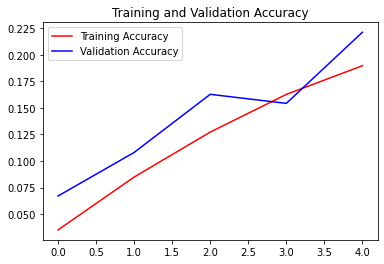

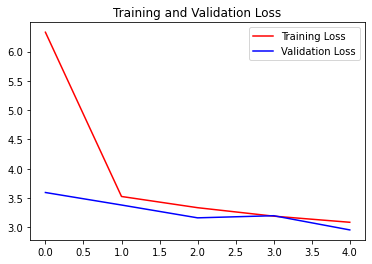

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label = 'Training Accuracy')
plt.plot(epochs, val_acc, 'b', label = 'Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend(loc = 'best')
plt.show()

plt.plot(epochs, loss, 'r', label = 'Training Loss')
plt.plot(epochs, val_loss, 'b', label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend(loc = 'best')
plt.show()

#### Predict New Image

Now we will use our baseline model to predict some new image that it has never seen before. First we will try to upload new picture from local directory then try to predict what class it belongs to

Saving download.jpg to download.jpg
download.jpg
[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 4.7156050e-26 0.0000000e+00 2.2061983e-28
 4.9469852e-11 1.1842813e-27 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 9.9982697e-01 0.0000000e+00
 1.7311312e-04 0.0000000e+00 0.0000000e+00 3.2486056e-21 0.0000000e+00
 1.7347819e-32 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00]
This image belongs to class 23


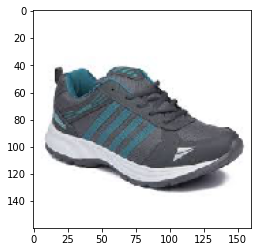

In [ ]:
import numpy as np
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = fn
  img = image.load_img(path, target_size = (160, 160))
  imgplot = plt.imshow(img)
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis = 0)

  images = np.vstack([x])
  classes = model.predict(images, batch_size = 500)

  print(fn)
  print(classes[0])

  class_list = sorted(os.listdir('/content/train-and-val/train/train/'))
  
  for j in range(42):
    if classes[0][j] == max(classes[0]) :
      print('This image belongs to class', class_list[j])
      break

Now we will predict the image from test dataset and save the result on a .csv file

In [ ]:
import pandas as pd

test_result = pd.read_csv('/content/test.csv')
test_dir = '/content/test/test/test/'
test_result['category'] = str(test_result['category'])

for i in range(len(test_result['filename'])):
  path = test_dir + test_result['filename'][i]
  img = image.load_img(path, target_size = (160, 160))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis = 0)
  images = np.vstack([x])
  classes = model.predict(images, batch_size = 500)
  class_list = sorted(os.listdir('/content/train-and-val/train/train/'))
  
  for j in range(42):
    if classes[0][j] == max(classes[0]) :
      test_result['category'][i] = class_list[j]
      break

test_result.head()

,filename,category
0,fd663cf2b6e1d7b02938c6aaae0a32d2.jpg,12
1,c7fd77508a8c355eaab0d4e10efd6b15.jpg,22
2,127f3e6d6e3491b2459812353f33a913.jpg,12
3,5ca4f2da11eda083064e6c36f37eeb81.jpg,36
4,46d681a542f2c71be017eef6aae23313.jpg,26


In [ ]:
test_result.to_csv(r'/content/test_result.csv', index = False)

### Transfer Learning Model

For the second model, we will use already-trained model called **ResNet152V2**. This is pre-trained on the ImageNet dataset, a large dataset consisting of 1.4M images and 1000 classes. ImageNet is a research training dataset with a wide variety of categories like jackfruit and syringe

For more info on **ResNet152V2** please click [this link](https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33). If you are interested in another pre-trained model options, please click [this link](https://www.tensorflow.org/api_docs/python/tf/keras/applications)

#### First Transfer Learning Model

Now that we have already prepared our images, we can start transfer the **ResNet152V2** model to our CNN structure

In [ ]:
from tensorflow.keras.applications import ResNet152V2

# Create the base model from the pre-trained model ResNet152V2
base_model = ResNet152V2(input_shape = (160, 160, 3),
                         include_top = False,
                         weights = 'imagenet')

234553344/234545216 [==============================] - 2s 0us/step


For our first transfer learning model, we will freeze the convolutional base created from the previous step and to use as a feature extractor. Additionally, we add a classifier on top of it and train the top-level classifier.

Freezing the convolutional base means that we do not want to train the transferred layers again, we just want to use the layers at it is (not updating the weight).

In [ ]:
base_model.trainable = False
base_model.summary()

Model: "resnet152v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 166, 166, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 80, 80, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 82, 82, 64)   0           conv1_conv[0][0]                 
________________________________________________________________________________________

Now we will stack our transferred layers with a flatten layer and a dense layer to do the classification on our images

In [ ]:
model_new = tf.keras.Sequential([
  base_model,
  tf.keras.layers.GlobalAveragePooling2D(),
  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Dense(42, activation = 'softmax')
])
model_new.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet152v2 (Model)          (None, 5, 5, 2048)        58331648  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 42)                86058     
Total params: 58,417,706
Trainable params: 86,058
Non-trainable params: 58,331,648
_________________________________________________________________


We can see that our trainable parameters is reduced to only 86,058, because the other 58M+ parameters from our transferred layers are freezed.

Next, we will compile and run the model

In [ ]:
model_new.compile(loss = 'sparse_categorical_crossentropy',
                  optimizer = RMSprop(learning_rate = 0.001),
                  metrics = ['accuracy'])

In [ ]:
history_new = model_new.fit(
                train_generator,
                epochs = 5,
                validation_data = val_generator,
                verbose = 1
)

Epoch 1/5
 11/211 [>.............................] - ETA: 5:22:12 - loss: 3.5948 - accuracy: 0.1815

In [ ]:
acc = history_new.history['accuracy']
val_acc = history_new.history['val_accuracy']
loss = history_new.history['loss']
val_loss = history_new.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label = 'Training Accuracy')
plt.plot(epochs, val_acc, 'b', label = 'Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend(loc = 'best')
plt.show()

plt.plot(epochs, loss, 'r', label = 'Training Loss')
plt.plot(epochs, val_loss, 'b', label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend(loc = 'best')
plt.show()

In [ ]:
import numpy as np
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = fn
  img = image.load_img(path, target_size = (160, 160))
  imgplot = plt.imshow(img)
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis = 0)

  images = np.vstack([x])
  classes = model_new.predict(images, batch_size = 500)

  print(fn)
  print(classes[0])

  class_list = sorted(os.listdir('/content/train-and-val/train/train/'))
  print(class_list)

  for j in range(42):
    if classes[0][j] == max(classes[0]) :
      print('This image belongs to class', class_list[j])
      break

In [ ]:
import pandas as pd

test_result_new = pd.read_csv('/content/test.csv')
test_dir = '/content/test/test/test/'
test_result_new['category'] = str(test_result_new['category'])

for i in range(len(test_result_new['filename'])):
  path = test_dir + test_result_new['filename'][i]
  img = image.load_img(path, target_size = (160, 160))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis = 0)
  images = np.vstack([x])
  classes = model_new.predict(images, batch_size = 500)
  class_list = sorted(os.listdir('/content/train-and-val/train/train/'))
  
  for j in range(42):
    if classes[0][j] == max(classes[0]) :
      test_result_new['category'][i] = class_list[j]
      break

test_result_new.head()

In [ ]:
test_result_new.to_csv(r'/content/test_result_new.csv', index = False)

###Fine Tuning

Now we will unfreeze some of the layers from our base model and include those layers in the training

In [ ]:
base_model.trainable = True

In [ ]:
print("Number of layers in the base model: ", len(base_model.layers))

In [ ]:
# Fine-tune from this layer onwards
fine_tune_at = 500

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [ ]:
model_new.compile(loss = 'sparse_categorical_crossentropy',
                    optimizer = RMSprop(learning_rate = 0.0001),
                    metrics = ['accuracy'])

In [ ]:
model_new.summary()

In [ ]:
history_new_fine = model_new.fit(
                      train_generator,
                      epochs = 10,
                      initial_epoch =  history_new.epoch[-1],
                      validation_data = val_generator,
                      verbose = 1
)

In [ ]:
acc = history_new_fine.history['accuracy']
val_acc = history_new_fine.history['val_accuracy']
loss = history_new_fine.history['loss']
val_loss = history_new_fine.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label = 'Training Accuracy')
plt.plot(epochs, val_acc, 'b', label = 'Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend(loc = 'best')
plt.show()

plt.plot(epochs, loss, 'r', label = 'Training Loss')
plt.plot(epochs, val_loss, 'b', label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend(loc = 'best')
plt.show()

In [ ]:
import numpy as np
from keras.preprocessing import image

uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = fn
  img = image.load_img(path, target_size = (160, 160))
  imgplot = plt.imshow(img)
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis = 0)

  images = np.vstack([x])
  classes = model_new.predict(images, batch_size = 500)

  print(fn)
  print(classes[0])

  class_list = sorted(os.listdir('/content/train-and-val/train/train/'))
  print(class_list)

  for j in range(42):
    if classes[0][j] == max(classes[0]) :
      print('This image belongs to class', class_list[j])
      break

In [ ]:
import pandas as pd

test_result_new_2 = pd.read_csv('/content/test.csv')
test_dir = '/content/test/test/test/'
test_result_new_2['category'] = str(test_result_new_2['category'])

for i in range(len(test_result_new_2['filename'])):
  path = test_dir + test_result_new_2['filename'][i]
  img = image.load_img(path, target_size = (160, 160))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis = 0)
  images = np.vstack([x])
  classes = model_new.predict(images, batch_size = 500)
  class_list = sorted(os.listdir('/content/train-and-val/train/train/'))
  
  for j in range(42):
    if classes[0][j] == max(classes[0]) :
      test_result_new_2['category'][i] = class_list[j]
      break

test_result_new_2.head()

In [ ]:
test_result_new_2.to_csv(r'/content/test_result_new_2.csv', index = False)